In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [29]:
df = pd.read_csv('E1_right hip_102373_2024-08-27 14-57-00_processed_sheet.csv')

C:\Users\saira\AppData\Local\Temp\ipykernel_17912\2329829382.py:1: DtypeWarning:

Columns (7,8) have mixed types. Specify dtype option on import or set low_memory=False.



In [2]:
df = pd.read_csv("DATA.csv",skiprows = 99)

In [ ]:
df.columns

<Axes: xlabel='Unnamed: 0', ylabel='Up down angle'>

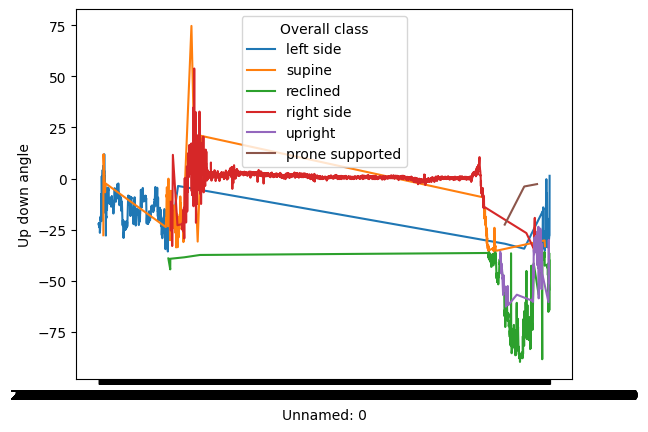

In [21]:
sns.lineplot(data = df, x = df['Unnamed: 0'], y = df['Up down angle'], hue = df['Overall class'])

In [38]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Data decimation function
def decimate_data(df, n=10000):
    if len(df) > n:
        return df.iloc[::len(df)//n]
    return df

# Decimate the data
df_decimated = decimate_data(df)

# Create color map
unique_classes = df_decimated['Overall class'].unique()
color_map = {cls: f'rgb({hash(cls) % 256}, {(hash(cls) * 2) % 256}, {(hash(cls) * 3) % 256})' for cls in unique_classes}

# Create the figure
fig = go.Figure()

# Prepare data for colored points
colors = [color_map[cls] for cls in df_decimated['Overall class']]
x = df_decimated['Time'].tolist()
y = df_decimated['Up/down angle'].tolist()

# Add colored points
fig.add_trace(go.Scattergl(
    x=x,
    y=y,
    mode='lines+markers',
    marker=dict(color=colors, size=2),
    line=dict(color='rgba(255,255,255,0.5)', width=1),
    showlegend=False
))

# Add legend
for cls in unique_classes:
    fig.add_trace(go.Scatter(
        x=[None],
        y=[None],
        mode='markers',
        marker=dict(color=color_map[cls], size=10),
        name=cls
    ))

# Update layout
fig.update_layout(
    title='Up/Down Angle Over Time',
    xaxis_title='Time',
    yaxis_title='Up/Down Angle',
    legend_title='Overall Class',
    font=dict(size=12)
)

# Show the plot
fig.show()

In [45]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import math

# Load the data (assuming df is already loaded)

# Function to create blocks of data
def create_data_blocks(df, block_size=50000):
    total_blocks = math.ceil(len(df) / block_size)
    return [df[i*block_size:(i+1)*block_size] for i in range(total_blocks)]

# Create data blocks
data_blocks = create_data_blocks(df)

# Function to plot a specific block
def plot_block(block_number):
    df_block = data_blocks[block_number]
    
    # Create a more professional color palette
    color_palette = px.colors.qualitative.Safe
    
    # Create the figure
    fig = go.Figure()
    
    # Add colored points
    for i, cls in enumerate(df_block['Overall class'].unique()):
        df_class = df_block[df_block['Overall class'] == cls]
        fig.add_trace(go.Scatter(
            x=df_class['Time'],
            y=df_class['Up/down angle'],
            mode='markers',
            marker=dict(color=color_palette[i % len(color_palette)], size=4, opacity=0.7),
            name=cls,
            legendgroup=cls,
            showlegend=True
        ))
    
    # Update layout for a more professional look
    fig.update_layout(
        title={
            'text': f'Body Position Analysis Over Time (Block {block_number + 1} of {len(data_blocks)})',
            'font': dict(size=24, color='#333'),
            'x': 0.5,
            'xanchor': 'center',
            'y': 0.95,
            'yanchor': 'top'
        },
        xaxis_title='Time',
        yaxis_title='Up/Down Angle (degrees)',
        font=dict(family="Arial, sans-serif", size=14, color="#333"),
        legend_title='Body Position',
        legend=dict(
            orientation="v",
            yanchor="middle",
            y=0.5,
            xanchor="left",
            x=1.02
        ),
        plot_bgcolor='white',
        hovermode='closest',
        margin=dict(t=100, b=50, l=50, r=150),
    )
    
    # Update axes
    fig.update_xaxes(
        showgrid=True, gridwidth=1, gridcolor='#E5E5E5',
        showline=True, linewidth=2, linecolor='#333',
        tickformat='%H:%M\n%b %d'
    )
    fig.update_yaxes(
        showgrid=True, gridwidth=1, gridcolor='#E5E5E5',
        showline=True, linewidth=2, linecolor='#333',
        zeroline=True, zerolinewidth=2, zerolinecolor='#333'
    )
    
    # Add a subtle background color
    fig.update_layout(
        shapes=[
            dict(
                type="rect",
                xref="paper",
                yref="paper",
                x0=0,
                y0=0,
                x1=1,
                y1=1,
                fillcolor="#F8F9FA",
                opacity=0.5,
                layer="below",
                line_width=0,
            )
        ]
    )
    
    return fig

# User interaction
while True:
    print(f"\nTotal number of blocks: {len(data_blocks)}")
    block_choice = input("Enter the block number to plot (1 to {}) or 'q' to quit: ".format(len(data_blocks)))
    
    if block_choice.lower() == 'q':
        break
    
    try:
        block_number = int(block_choice) - 1
        if 0 <= block_number < len(data_blocks):
            fig = plot_block(block_number)
            fig.show()
        else:
            print("Invalid block number. Please try again.")
    except ValueError:
        print("Invalid input. Please enter a number or 'q' to quit.")


Total number of blocks: 178
Enter the block number to plot (1 to 178) or 'q' to quit: 50



Total number of blocks: 178
Enter the block number to plot (1 to 178) or 'q' to quit: q


In [42]:
# Data decimation function
def decimate_data(df, n=10000):
    if len(df) > n:
        return df.groupby('Overall class').apply(lambda x: x.iloc[::len(x)//n]).reset_index(drop=True)
    return df

# Decimate the data
df_decimated = decimate_data(df)

# Create a more professional color palette
color_palette = px.colors.qualitative.Safe

# Create the figure
fig = go.Figure()

# Add lines for each class
for i, cls in enumerate(df_decimated['Overall class'].unique()):
    df_class = df_decimated[df_decimated['Overall class'] == cls].sort_values('Time')
    fig.add_trace(go.Scatter(
        x=df_class['Time'],
        y=df_class['Up/down angle'],
        mode='lines',
        line=dict(color=color_palette[i % len(color_palette)], width=2),
        name=cls,
        legendgroup=cls,
        showlegend=True
    ))

# Update layout for a more professional look
fig.update_layout(
    title={
        'text': 'Body Position Analysis Over Time',
        'font': dict(size=24, color='#333'),
        'x': 0.5,
        'xanchor': 'center',
        'y': 0.95,
        'yanchor': 'top'
    },
    xaxis_title='Time',
    yaxis_title='Up/Down Angle (degrees)',
    font=dict(family="Arial, sans-serif", size=14, color="#333"),
    legend_title='Body Position',
    legend=dict(
        orientation="v",  # Vertical legend
        yanchor="middle",  # Align to the middle of the plot
        y=0.5,             # Vertically center the legend
        xanchor="left",    # Align legend to the right of the plot
        x=1.02             # Slightly offset to the right outside the plot area
    ),
    plot_bgcolor='white',
    hovermode='closest',
    margin=dict(t=100, b=50, l=50, r=150),  # Increase right margin for legend
)

# Update axes
fig.update_xaxes(
    showgrid=True, gridwidth=1, gridcolor='#E5E5E5',
    showline=True, linewidth=2, linecolor='#333',
    tickformat='%H:%M\n%b %d'
)
fig.update_yaxes(
    showgrid=True, gridwidth=1, gridcolor='#E5E5E5',
    showline=True, linewidth=2, linecolor='#333',
    zeroline=True, zerolinewidth=2, zerolinecolor='#333'
)

# Add a subtle background color
fig.update_layout(
    shapes=[
        dict(
            type="rect",
            xref="paper",
            yref="paper",
            x0=0,
            y0=0,
            x1=1,
            y1=1,
            fillcolor="#F8F9FA",
            opacity=0.5,
            layer="below",
            line_width=0,
        )
    ]
)

# Show the plot
fig.show()